# **Cinemática de un robot planar**

**Docente:** PhD Jorge Rudas

**Diseño de prototipos - 2025 I**

**INFOTEP**

## Importar librerias

In [1]:
import numpy as np
from sympy import*
init_printing()

## Se crean variables simbólicas

In [2]:
## Variables Simbolicas
theta_1 = symbols("theta_1",  real=True)
theta_2 = symbols("theta_2",  real=True)
l_1 = symbols("l_1",  real=True)
l_2 = symbols("l_2",  real=True)

## Transformación desde el estado 0 al estado 1

In [3]:
_0H1 = Matrix([[cos(theta_1), -sin(theta_1), 0, 0], [sin(theta_1), cos(theta_1), 0, 0], [0, 0, 1, 0], [0, 0, 0, 1]])

In [4]:
_0H1


⎡cos(θ₁)  -sin(θ₁)  0  0⎤
⎢                       ⎥
⎢sin(θ₁)  cos(θ₁)   0  0⎥
⎢                       ⎥
⎢   0        0      1  0⎥
⎢                       ⎥
⎣   0        0      0  1⎦

## Transformación desde el estado 1 al estado 2

In [5]:
_1H2 = Matrix([[1, 0, 0, l_1], [0, 1, 0, 0], [0, 0, 1, 0], [0, 0, 0, 1]])

In [6]:
_1H2

⎡1  0  0  l₁⎤
⎢           ⎥
⎢0  1  0  0 ⎥
⎢           ⎥
⎢0  0  1  0 ⎥
⎢           ⎥
⎣0  0  0  1 ⎦

In [7]:
H=_0H1@_1H2
H

⎡cos(θ₁)  -sin(θ₁)  0  l₁⋅cos(θ₁)⎤
⎢                                ⎥
⎢sin(θ₁)  cos(θ₁)   0  l₁⋅sin(θ₁)⎥
⎢                                ⎥
⎢   0        0      1      0     ⎥
⎢                                ⎥
⎣   0        0      0      1     ⎦

## Transformación desde el estado 2 al estado 3

In [8]:
_2H3 = Matrix([[cos(theta_2), -sin(theta_2), 0, 0], [sin(theta_2), cos(theta_2), 0, 0], [0, 0, 1, 0], [0, 0, 0, 1]])

In [9]:
_2H3

⎡cos(θ₂)  -sin(θ₂)  0  0⎤
⎢                       ⎥
⎢sin(θ₂)  cos(θ₂)   0  0⎥
⎢                       ⎥
⎢   0        0      1  0⎥
⎢                       ⎥
⎣   0        0      0  1⎦

## Transformación desde el estado 3 al estado 4

In [10]:
_3H4 = Matrix([[1, 0, 0, l_2], [0, 1, 0, 0], [0, 0, 1, 0], [0, 0, 0, 1]])

In [11]:
_3H4


⎡1  0  0  l₂⎤
⎢           ⎥
⎢0  1  0  0 ⎥
⎢           ⎥
⎢0  0  1  0 ⎥
⎢           ⎥
⎣0  0  0  1 ⎦

In [12]:
H=_2H3@_3H4
H

⎡cos(θ₂)  -sin(θ₂)  0  l₂⋅cos(θ₂)⎤
⎢                                ⎥
⎢sin(θ₂)  cos(θ₂)   0  l₂⋅sin(θ₂)⎥
⎢                                ⎥
⎢   0        0      1      0     ⎥
⎢                                ⎥
⎣   0        0      0      1     ⎦

## Composición de cada estado de la cinemática

In [13]:
H = simplify(_0H1@_1H2@_2H3@_3H4)

In [14]:
H

⎡cos(θ₁ + θ₂)  -sin(θ₁ + θ₂)  0  l₁⋅cos(θ₁) + l₂⋅cos(θ₁ + θ₂)⎤
⎢                                                            ⎥
⎢sin(θ₁ + θ₂)  cos(θ₁ + θ₂)   0  l₁⋅sin(θ₁) + l₂⋅sin(θ₁ + θ₂)⎥
⎢                                                            ⎥
⎢     0              0        1               0              ⎥
⎢                                                            ⎥
⎣     0              0        0               1              ⎦

## Posición del efector final

In [15]:
P = H[0:2, 3]

In [16]:
P

⎡l₁⋅cos(θ₁) + l₂⋅cos(θ₁ + θ₂)⎤
⎢                            ⎥
⎣l₁⋅sin(θ₁) + l₂⋅sin(θ₁ + θ₂)⎦

In [17]:
import matplotlib.pyplot as plt
import numpy as np

def dibujar_brazo_mecanico(theta1, theta2, l1, l2):
  """Función para dibujar un brazo mecanico con 2 grados de libertad.

  Parametros:
    theta1: Angulo de la primera articulacion en radianes.
    theta2: Angulo de la segunda articulacion en radianes.
    l1: Longitud del primer extremo
    l2: Longitud del segundo extremo
  """

  # Calculamos la posición del efector final
  x1 = l1 * np.cos(theta1)
  y1 = l1 * np.sin(theta1)
  x2 = x1 + l2 * np.cos(theta1 + theta2)
  y2 = y1 + l2 * np.sin(theta1 + theta2)

  # Dibujando el brazo con lineas y puntos
  plt.figure(figsize=(6, 6))
  plt.plot([0, x1], [0, y1], 'b-', linewidth=5)  # First link
  plt.plot([x1, x2], [y1, y2], 'b-', linewidth=5)  # Second link
  plt.plot(0, 0, 'ro', markersize=10)  # Base
  plt.plot(x2, y2, 'go', markersize=10)  # End-effector

  # Se dibujan los límites y los labels
  plt.xlim([-l1 - l2, l1 + l2])
  plt.ylim([-l1 - l2, l1 + l2])
  plt.xlabel('X')
  plt.ylabel('Y')
  plt.title('Brazo robótico')
  plt.grid(True)
  plt.show()

## Ejemplo de manipulación del brazo robotico en su estado final

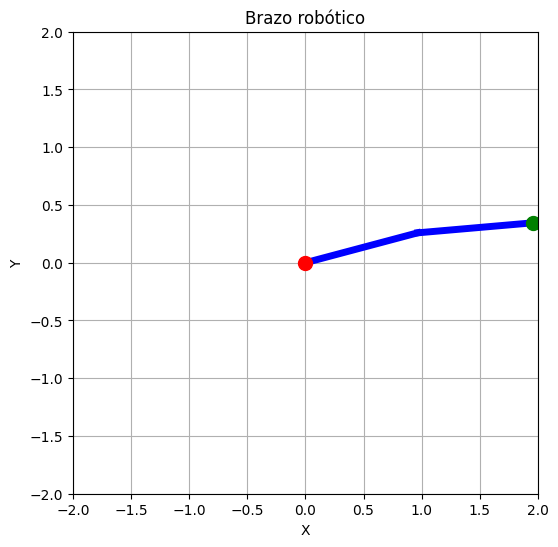

In [18]:
theta1 = np.deg2rad(15)  # 45 grados
theta2 = np.deg2rad(-10)  # -30 grados
l1 = 1
l2 = 1
dibujar_brazo_mecanico(theta1, theta2, l1, l2)

## **Taller**

*  Dibujar cada estado del anterior brazo robótico
*  Imagine un brazo robótico cuyas extremidades miden 2 unidades cada una. Podría este brazo alcanzar cualquier objeto dentro de la cuadricula de 2 x 2? Explique detalladamente su razonamiento

punto 1

In [19]:
def dibujar_brazo_en_estados(theta1, theta2, l1, l2):
    estados = [("Estado 0", 0, 0), ("Estado 1", theta1, 0), ("Estado 2", theta1, l1),
               ("Estado 3", theta1 + theta2, l1), ("Estado 4", theta1 + theta2, l1 + l2)]

    for i, (titulo, t, longitud) in enumerate(estados):
        x1 = longitud * np.cos(t)
        y1 = longitud * np.sin(t)
        x2 = x1 + l2 * np.cos(t)
        y2 = y1 + l2 * np.sin(t)

        plt.figure(figsize=(6, 6))
        plt.plot([0, x1], [0, y1], 'b-', linewidth=5)  # First link
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=5)  # Second link
        plt.plot(0, 0, 'ro', markersize=10)  # Base
        plt.plot(x2, y2, 'go', markersize=10)  # End-effector

        # Se dibujan los límites y los labels
        plt.xlim([-l1 - l2, l1 + l2])
        plt.ylim([-l1 - l2, l1 + l2])
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.title('Brazo robótico')
        plt.grid(True)
    plt.show()


In [20]:
theta1 = np.deg2rad(15)
theta2 = np.deg2rad(-10)
l1, l2 = 1, 1


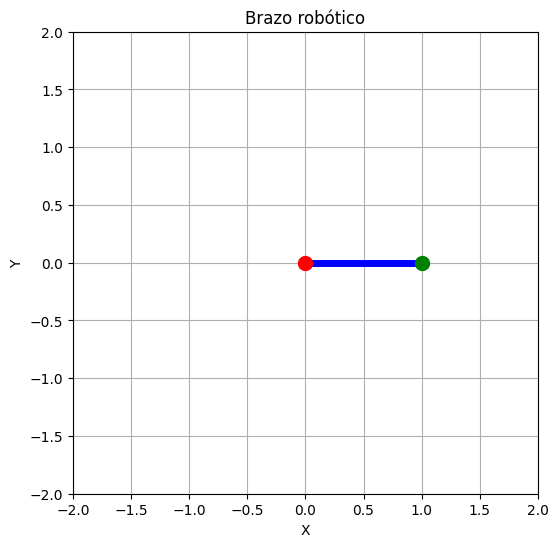

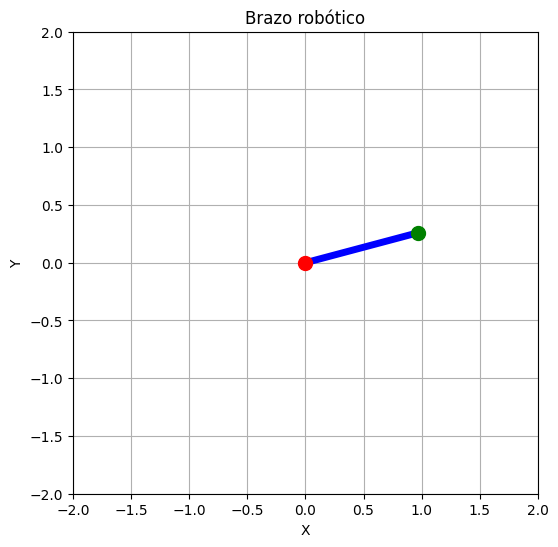

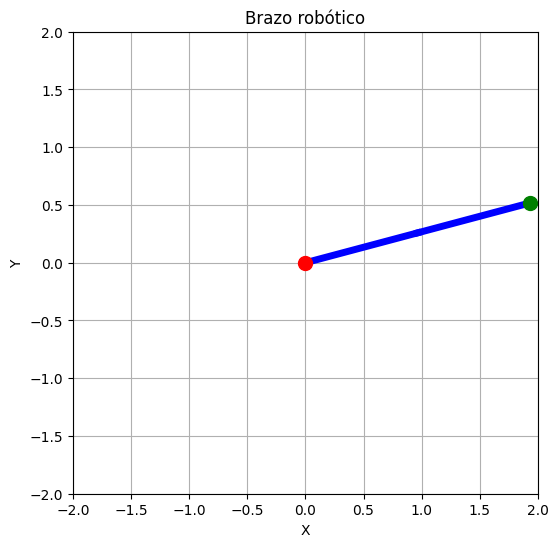

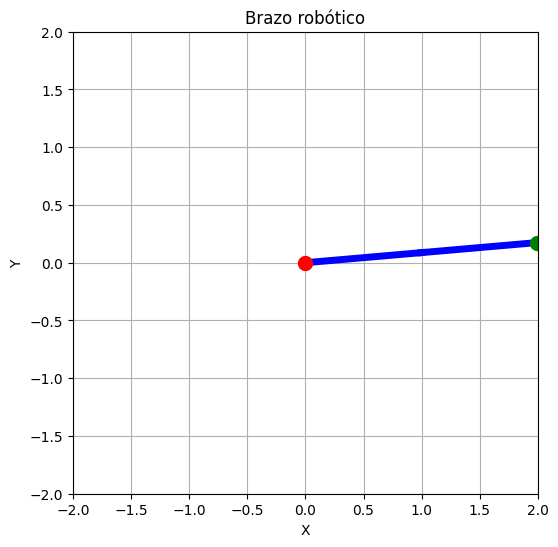

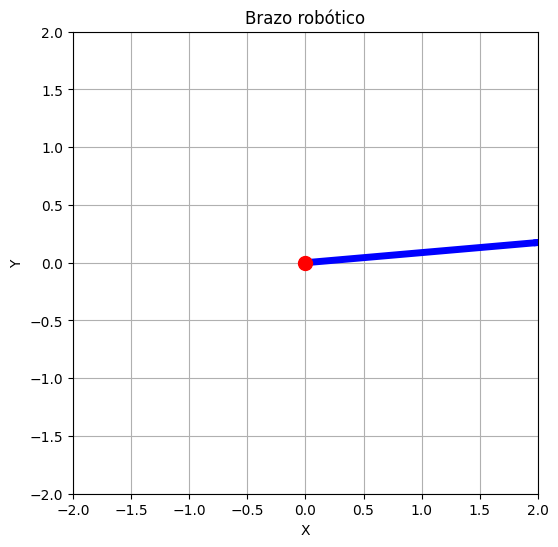

In [21]:
dibujar_brazo_en_estados(theta1, theta2, l1, l2)

# **PUNTO** ***2***

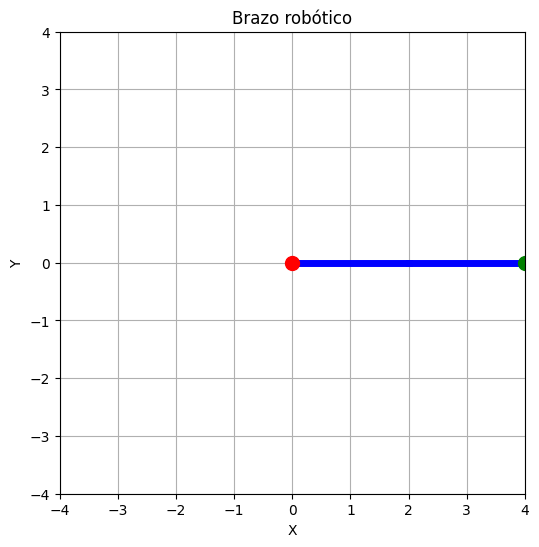

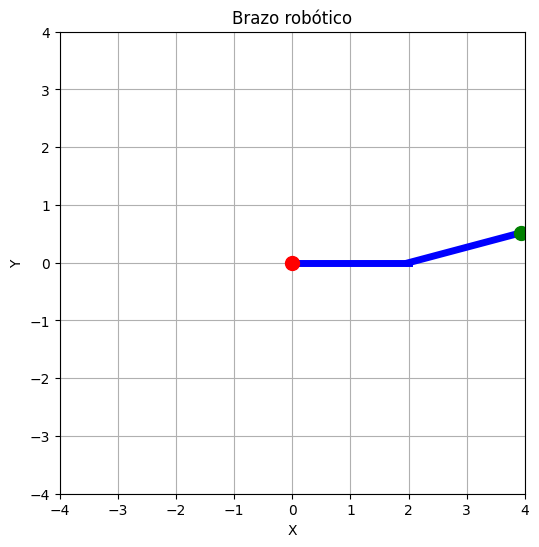

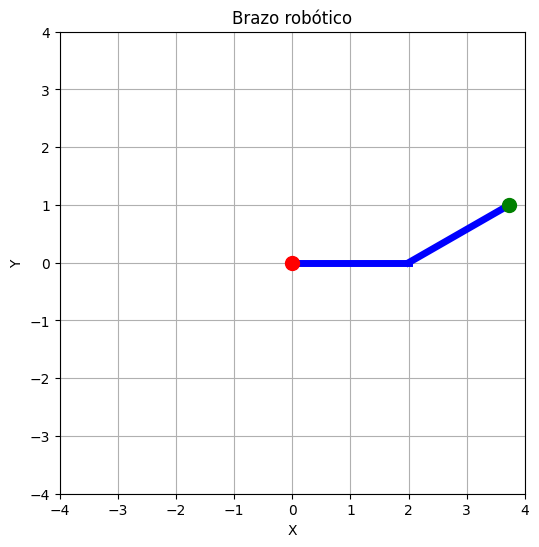

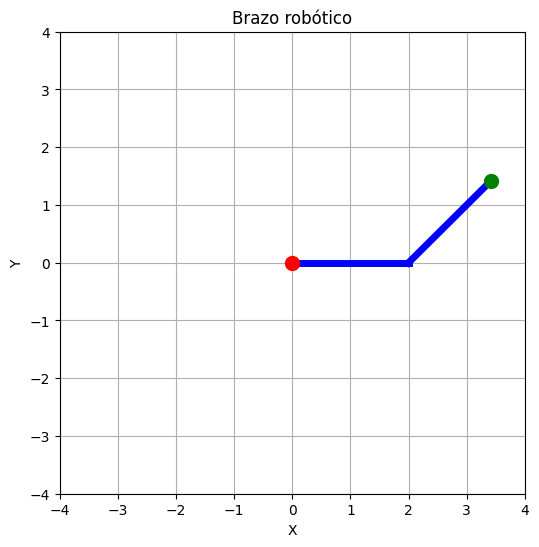

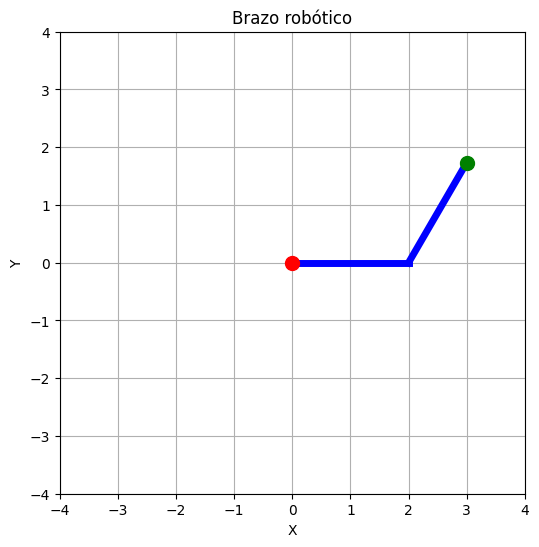

...

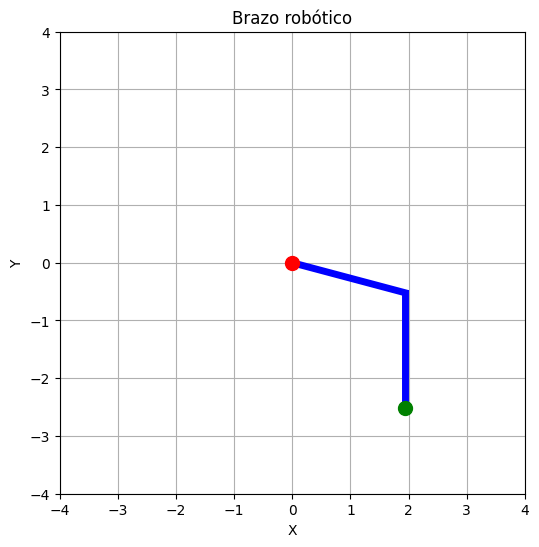

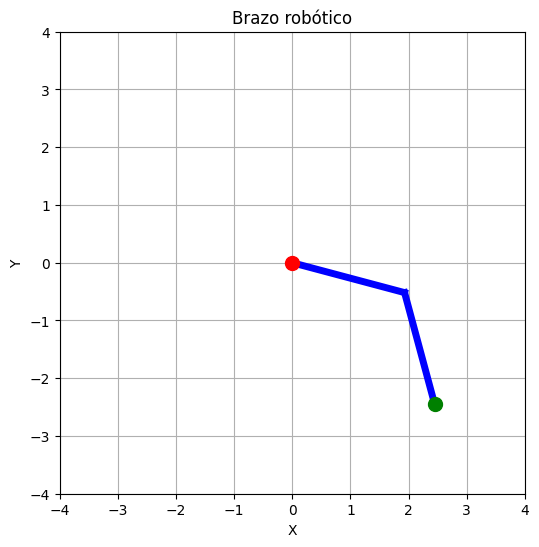

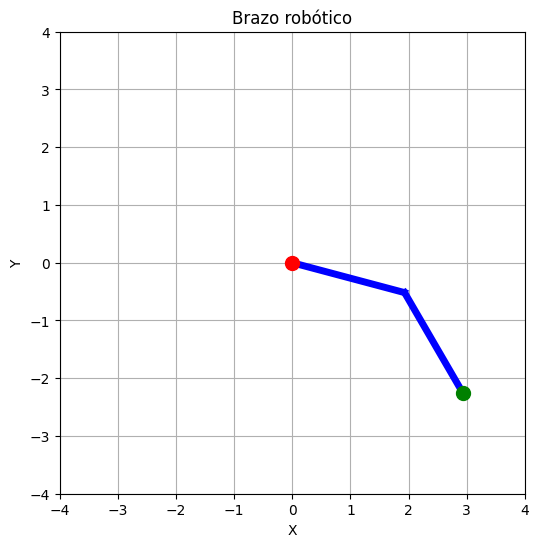

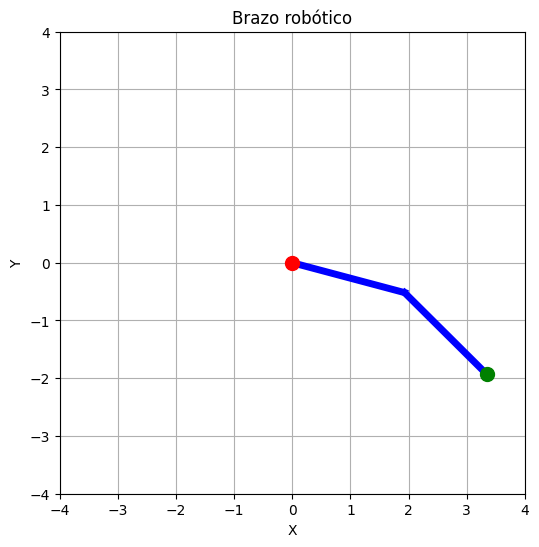

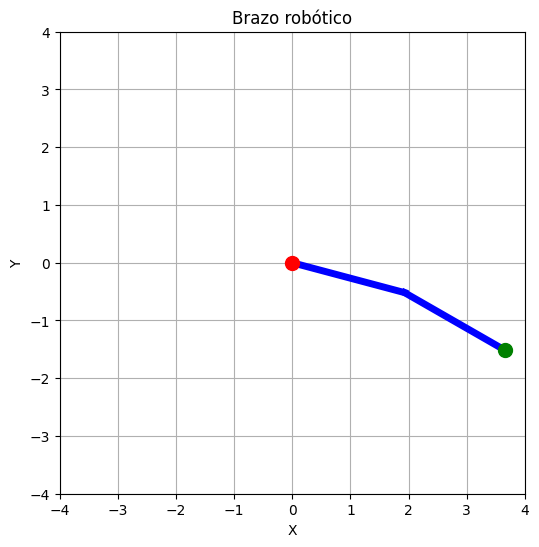

In [27]:
l1 = 2
l2 = 2

for theta1_d in range(0, 360, 15):
    for theta2_d in range(0, 360, 15):
        theta1 = np.deg2rad(theta1_d)
        theta2 = np.deg2rad(theta2_d)
        dibujar_brazo_mecanico(theta1, theta2, l1, l2)

Para responder la pregunta si el brazo robotico que mide 2 unidades puede alcanzar cualquier objeto dentro de la cuadricula 2x2 lo que se hizo fue crear un blucle. este blucu incluye la definion de unos rangos tanto para theta1_d y theta2_d cada uno inicia en 0 grados que es el estado inicial ,despues se le sigue 360 el brazo realiza multiples movimientos y solo se  detendrá antes de llegar a 360 grados, y por ultimo seria el aumento  de 15 grados en cada iteración es decir si inia en 0 se amuenta a 15 despues 30, y asi sucesivamenten  asta los 345 grados. con este podremos avarcar cada espacio de la cuadricula y poder ver asta donde llega el brazo en cada direcion posible dentro de los 360 grados